In [1]:
#importación de paqueterías

#Ignorar advertencias
import warnings
warnings.simplefilter('ignore')

#Procesamiento de datos
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.1f' % x)
import numpy as np
from math import sqrt


#Visualización
import plotly
import plotly.express as px
import seaborn as sns
import plotly.figure_factory as ff


#PCA, encoding y normalizar datos
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

In [2]:
def to_lower(df):
  columnsTolower = list(df.select_dtypes(include=['category','object']))
  for feature in columnsTolower:
      try:
          df[feature] = df[feature].str.lower()
      except:
          print('Error parsing '+feature)
  return df

### Lectura y unión de datasets

In [3]:
mutual_art = pd.read_csv('../datasets/clean/clean_mut_art_ver2_ajustado.csv').drop(columns=['Unnamed: 0'])
artsy = pd.read_csv('../datasets/clean/datosArtsy.csv')

In [4]:
artsy.height = artsy.height.str.split(' ')
artsy.length = artsy.length.str.split(' ')
artsy.height = artsy.height.apply(lambda x: x[0])
artsy.length = artsy.length.apply(lambda x: x[0])

In [5]:
# Transformación de tipo de datos
df = pd.concat([artsy,mutual_art])
df['height'] = df['height'].astype(float)
df['length'] = df['length'].astype(float)
df['price'] = df['price'].astype(float)
df['performance'] = df['performance'].astype(float)
#df['año_venta'] = pd.to_datetime(df['sale_date'],yearfirst=True)
#df['año_venta'] = df['año_venta'].astype(str).str.slice(stop=4)


# Añadir precio por cm2
df = df.assign(precio_cm2 = lambda x: (x['price']/(x['height']*x['length'])))
#Eliminar valores infinitos (Surgen cuando largo o ancho son 0)
df=df[~df.isin([np.inf, -np.inf]).any(1)]
df=to_lower(df)

In [6]:
df.head(5)

,title,height,length,art_type,medium_text,date_text,age,house,sale_date,price,author,performance,source,country,fecha,precio_cm2
0,caminadora viajera,50.0,52.6,sculpture,bronze with gold-brown patina,NaN,NaN,sotheby's,1969-12-31 18:00:40.857,45000.0,abigail varela,0.5,artsy,venezuela,NaN,17.1
1,i) untitled; ii) untitled; iii) untitled,33.0,24.8,work on paper,gouache and graphite on paper; watercolor and ...,1960.0,33.0,christie's,1969-12-31 18:00:44.397,4000.0,agustin cardenas,0.3,artsy,cuba,NaN,4.9
2,untitled,56.0,44.0,print,print,NaN,NaN,artcuria,1969-12-31 18:00:43.271,226.0,agustin cardenas,-0.2,artsy,cuba,NaN,0.1
3,study for a sculpture,74.5,54.5,work on paper,pastel,1970.0,43.0,artcuria,1969-12-31 18:00:43.271,1810.0,agustin cardenas,1.4,artsy,cuba,NaN,0.4
4,untitled,29.0,56.0,sculpture,pink carrara marble,NaN,NaN,sotheby's,1969-12-31 18:00:43.059,43750.0,agustin cardenas,0.6,artsy,cuba,NaN,26.9


### Análisis exploratorio de datos

In [7]:
fig = px.box(df, y="price",points="all",title='Boxplot de precios (con outliers)')
fig.show()

In [8]:
# Eliminar outliers
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1
filter = (df['price'] >= Q1 - 1.5 * IQR) & (df['price'] <= Q3 + 1.5 *IQR)
df_sin_outliers = df.loc[filter]

#graficar
fig = px.box(df_sin_outliers, y="price",title='Boxplot de precios (Sin outliers)')
fig.show()

In [9]:
fig = px.box(df, y="precio_cm2",points="all",title='Boxplot de precios por cm2 (con outliers)')
fig.show()

In [10]:
# Eliminar outliers
Q1 = df['precio_cm2'].quantile(0.25)
Q3 = df['precio_cm2'].quantile(0.75)
IQR = Q3 - Q1
filter = (df['precio_cm2'] >= Q1 - 1.5 * IQR) & (df['precio_cm2'] <= Q3 + 1.5 *IQR)
df_sin_outliers = df.loc[filter]

#graficar
fig = px.box(df_sin_outliers, y="precio_cm2",title='Boxplot de precios por cm2 (sin outliers)')
fig.show()

In [11]:
filter = (df['precio_cm2'] >= Q1 - 1.5 * IQR) & (df['precio_cm2'] >= Q3 + 1.5 *IQR)
df_outliers = df.loc[filter]

Q1 = df_outliers['precio_cm2'].quantile(0.25)
Q3 = df_outliers['precio_cm2'].quantile(0.75)
IQR = Q3 - Q1

filter = (df_outliers['precio_cm2'] >= Q1 - 1.5 * IQR) & (df_outliers['precio_cm2'] <= Q3 + 1.5 *IQR)
df_out_sin_outliers = df_outliers.loc[filter]

fig = px.box(df_out_sin_outliers,x='source', y="precio_cm2",title='Boxplot de precios por cm2 (de outliers)')
fig.show()

In [12]:
fig = px.histogram(df, x="age",color='source',nbins=200,title='Distribución de la antiguedad de las obras')
fig.show()

In [13]:
fig = px.histogram(df, x="date_text",nbins=160,color='source',title='Distribución de la fecha de creación')
fig.show()

In [14]:
df_autores = df[['price','author']].groupby(['author']).mean().sort_values(by='price',ascending=False).reset_index()
fig = px.bar(df_autores.head(15), x='author', y='price',title='Precio de obra promedio por autor')
fig.show()

In [15]:
#df_conteo_obras = df.groupby(['author']).agg({''})

In [16]:
df_precio_cm2 = df[['precio_cm2','author']].groupby(['author']).mean().sort_values(by='precio_cm2',ascending=False).reset_index()
df_precio_cm2
fig = px.bar(df_precio_cm2.head(15), x='author', y='precio_cm2',title='Precio promedio del cm2 por autor')
fig.show()

In [17]:
df_art_medium = df[['medium_text','price']].groupby(['medium_text']).mean().sort_values(by='price',
                                                                                ascending=False).reset_index()
fig = px.bar(df_art_medium.head(15).sort_values(by='price'), x='price', y='medium_text',title='Precio promedio por estilo')
fig.show()

In [18]:
top_obras = df[['title','price']].groupby(['title']).agg({'price':['sum','count','mean','max']})
top_obras = top_obras['price']
top_obras = top_obras.sort_values(by='max',ascending=False).reset_index()
fig = px.bar(top_obras.head(15), x='title', y='max',title='Obras con mayor precio')
fig.show()

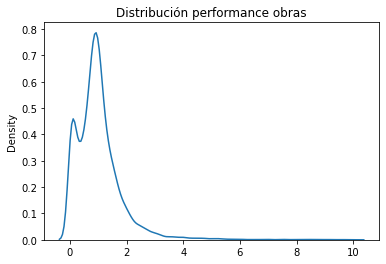

In [19]:
#Distribución performance sin outliers 
data = df["performance"][(df.performance <= 10) & (df.performance >=0)].values.tolist()
plt = sns.distplot(data,hist=False).set(title='Distribución performance obras')

In [20]:
corr = df[['height','length','age','price','performance','precio_cm2']].corr()
corr.style.background_gradient(cmap = 'coolwarm')

,height,length,age,price,performance,precio_cm2
height,1.000000,0.000307,-0.073079,0.010519,0.082840,-0.031558
length,0.000307,1.000000,0.002086,0.013425,0.007747,-0.002288
age,-0.073079,0.002086,1.000000,0.018716,-0.041038,0.032009
price,0.010519,0.013425,0.018716,1.000000,0.019484,0.222780
performance,0.082840,0.007747,-0.041038,0.019484,1.000000,0.021357
precio_cm2,-0.031558,-0.002288,0.032009,0.222780,0.021357,1.000000


## Análisis de componentes principales

In [21]:
#Codificacción de variables
def Encoder(df):
    data = df
    columnsToEncode = list(data.select_dtypes(include=['category','object']))
    le = LabelEncoder()
    for feature in columnsToEncode:
        try:
            data[feature] = le.fit_transform(data[feature])
        except:
            print('Error encoding '+feature)
    return data
data_codificada = Encoder(df)

#Eliminar valores nulos e infinitos
data_codificada=data_codificada[~data_codificada.isin([np.nan, np.inf, -np.inf]).any(1)]
#Cambiar a valores por desviaciones estandar
data_codificada['target'] = data_codificada['performance'].apply(lambda x: 'Muy alto' if x > 4.2 else 
                                                                 ('Alto' if x > 2.5 else 
                                                                  ('Medio' if x>0.8 else 'Bajo')))
data_codificada['target2'] = data_codificada['precio_cm2'].apply(lambda x: 'Muy alto' if x > 3886 else 
                                                                 ('Alto' if x > 2022 else 
                                                                  ('Medio' if x>158 else 'Bajo')))

In [22]:
features = ['medium_text','date_text','sale_date', 'author', 'performance', 'source',
       'country', 'fecha','house']
# Separating out the features
x = data_codificada.loc[:, features].values
#Estandarizar los datos
x = StandardScaler().fit_transform(x)
#Variables objetivo
y = data_codificada.loc[:,['target2']].values
#PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
targetDf = pd.DataFrame(data = y
             , columns = ['target'])
finalDf = pd.concat([principalDf, targetDf], axis = 1).reset_index()

In [23]:
fig = px.scatter(x=finalDf["principal component 1"], y=finalDf["principal component 2"],color=finalDf['target'])
fig.show()

In [24]:
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3'])
targetDf = pd.DataFrame(data = y
             , columns = ['target'])
finalDf = pd.concat([principalDf, targetDf], axis = 1).reset_index()

In [25]:
fig = px.scatter_3d(x=finalDf["principal component 1"], y=finalDf["principal component 2"],z=finalDf['principal component 3'],color=finalDf['target'])
fig.show()

In [26]:
from sklearn.cluster import KMeans

def calculate_wcss(data):
    wcss = []
    for n in range(2, 21):
        kmeans = KMeans(n_clusters=n)
        kmeans.fit(X=data)
        wcss.append(kmeans.inertia_)

    return wcss
data = data_codificada[['medium_text','date_text','sale_date', 'author', 'performance', 'source',
       'country', 'fecha','house']]
info = calculate_wcss(data)

In [27]:
clusters = np.arange(2,21,1)

In [28]:
fig = px.line(df, x=clusters, y=info, title='Gráfica de codo',markers=True)
fig.show()

In [29]:
def optimal_number_of_clusters(wcss):
    x1, y1 = 2, wcss[0]
    x2, y2 = 20, wcss[len(wcss)-1]

    distances = []
    for i in range(len(wcss)):
        x0 = i+2
        y0 = wcss[i]
        numerator = abs((y2-y1)*x0 - (x2-x1)*y0 + x2*y1 - y2*x1)
        denominator = sqrt((y2 - y1)**2 + (x2 - x1)**2)
        distances.append(numerator/denominator)
    
    return distances.index(max(distances)) + 2

In [30]:
clusters = optimal_number_of_clusters(info)

In [38]:
import seaborn as sns

from sklearn.cluster import KMeans


# preparing our data
df = data_codificada.drop(['target','target2'], axis=1)

# calculating the within clusters sum-of-squares for 19 cluster amounts
sum_of_squares = calculate_wcss(df)

# calculating the optimal number of clusters
n = optimal_number_of_clusters(sum_of_squares)

# running kmeans to our optimal number of clusters
kmeans = KMeans(n_clusters=n)
clusters = kmeans.fit_predict(df)

In [39]:
data_codificada['cluster'] = clusters

In [40]:
fig = px.scatter_matrix(data_codificada,color='cluster',height=1500,width=1500)
fig.show()

In [34]:
data_codificada.cluster.value_counts()

2    16228
0     1100
3       46
4        8
1        1
Name: cluster, dtype: int64